In [8]:
from fastai.vision.core import *
from fastai.vision import *
from fastai.vision.all import *
from pathlib import *
import torch
import os

In [9]:
data= ImageDataLoaders.from_folder(path='./LearningSet_2', train = "train", valid_pct=0.2, item_tfms=Resize(400,ResizeMethod.Squish), bs = 12, num_workers =0)

 Show random elements from data set.

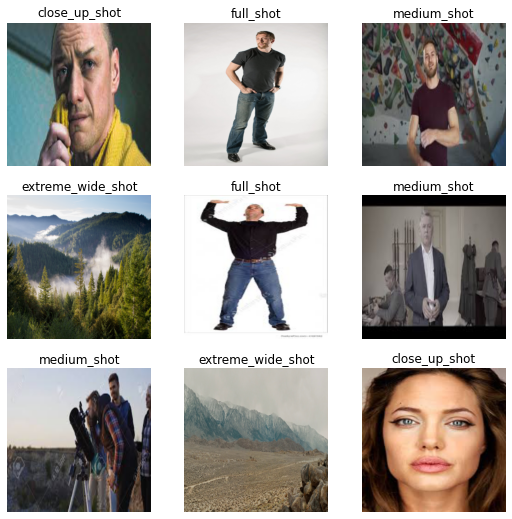

In [72]:
data.show_batch()

In [10]:
learn = cnn_learner(data, resnet50, metrics=[accuracy])

SuggestedLRs(lr_min=0.005754399299621582, lr_steep=0.0008317637839354575)

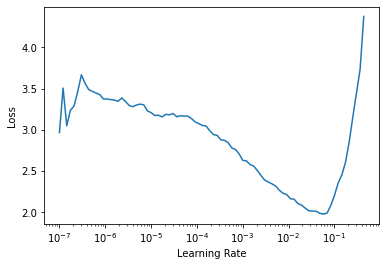

In [74]:
learn.lr_find()

In [76]:
suggested = (0.005754399299621582,0.0008317637839354575)

In [77]:
learn.fit_one_cycle(20, slice(suggested[0], suggested[1]))
#

epoch,train_loss,valid_loss,accuracy,time
0,0.909284,0.460627,0.846583,04:49
1,0.678817,0.436930,0.864714,03:58
2,0.729035,0.436271,0.868898,04:01
3,0.625436,0.484833,0.860530,04:07
4,0.571509,0.377412,0.877266,04:03
5,0.467747,0.330605,0.896792,04:05
6,0.401202,0.408126,0.841004,04:01
7,0.437840,0.297349,0.899582,04:04
8,0.334119,0.336642,0.892608,04:03
9,0.294032,0.295894,0.896792,04:00


In [ ]:
# epoch	train_loss	valid_loss	accuracy	time
# 0	0.712634	0.378508	0.875648	04:16
# 1	0.690157	0.564071	0.805699	04:15
# 2	0.613565	0.371556	0.866580	04:17
# 3	0.455612	0.373452	0.874352	04:18
# 4	0.394648	0.345117	0.892487	04:17
# 5	0.245492	0.327958	0.876943	04:17
# 6	0.210900	0.269956	0.908031	04:17
# 7	0.123444	0.252319	0.915803	04:19
# 8	0.086054	0.246458	0.919689	04:22

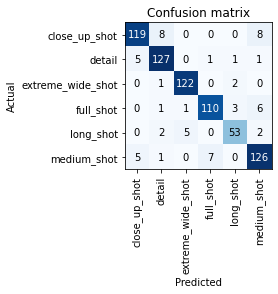

In [78]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()

In [79]:
learn.save('stage1-1')

Path('LearningSet_2/models/stage1-1.pth')

In [103]:
torch.cuda.empty_cache()

In [6]:
path = 'D:\Programowanie\AI\shot_classifier\LearningSet\models\stage1-1'
learn.load(path)

In [7]:
data= ImageDataLoaders.from_folder(path='./LearningSet', train = "train", valid_pct=0.2, item_tfms=Resize(400,ResizeMethod.Squish), bs = 10, num_workers =0)

In [8]:
learn = cnn_learner(data, resnet50, metrics=[accuracy])

In [9]:
learn.unfreeze()

SuggestedLRs(lr_min=0.001096478197723627, lr_steep=1.3182567499825382e-06)

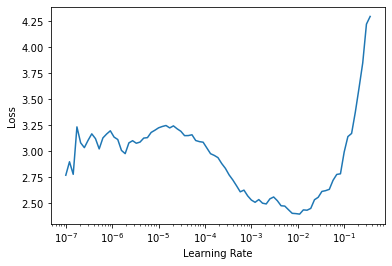

In [10]:
learn.lr_find()

In [22]:
suggested = (0.0033113110810518267, 0.0006918309954926372)

In [23]:
learn.fit_one_cycle(10, slice(suggested[0], suggested[1]))

epoch,train_loss,valid_loss,accuracy,time
0,0.759099,0.340529,0.882124,05:22
1,0.569199,0.347244,0.895078,05:21
2,0.526058,0.342324,0.897668,05:24
3,0.480575,0.290353,0.906736,05:14
4,0.352865,0.324739,0.902850,05:11
5,0.280782,0.287684,0.908031,05:20
6,0.188455,0.274844,0.911917,05:22
7,0.129441,0.281263,0.908031,05:18
8,0.166842,0.268367,0.913212,05:20
9,0.065022,0.261030,0.919689,05:18


In [63]:
learn.save('stage1-2')

Path('LearningSet/models/stage1-2.pth')

In [64]:
torch.cuda.empty_cache()

In [65]:
path = 'D:\Programowanie\AI\shot_classifier\LearningSet\models\stage1-2'
learn.load(path)

In [67]:
data= ImageDataLoaders.from_folder(path='./LearningSet', train = "train", valid_pct=0.2, item_tfms=Resize(BASE_SIZE*5,ResizeMethod.Squish), bs = 11, num_workers =0)
data= data.cuda()

In [68]:
learn = cnn_learner(data, resnet50, metrics=[accuracy])

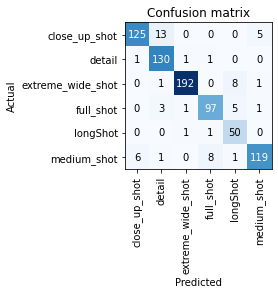

In [11]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()

SuggestedLRs(lr_min=0.004786301031708717, lr_steep=1.9054607491852948e-06)

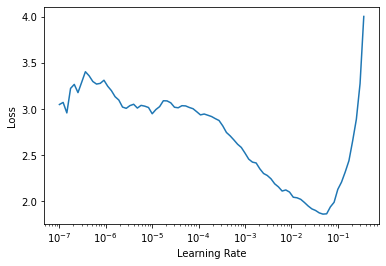

In [69]:
learn.lr_find()

In [ ]:
learn = cnn_learner(data, resnet50, metrics=[accuracy])

In [11]:
suggested = (0.004786301031708717, 1.9054607491852948e-06)

In [12]:
learn.fit_one_cycle(10, slice(suggested[0], suggested[1]))

epoch,train_loss,valid_loss,accuracy,time
0,2.276424,1.871334,0.348446,06:48
1,2.421804,1.843223,0.398964,05:56
2,2.463950,2.082058,0.455959,05:46
3,2.152004,1.610685,0.426166,05:44
4,2.149803,1.788498,0.424870,05:45
5,1.948946,3.756930,0.396373,05:44
6,1.730640,1.133890,0.599741,05:39
7,1.623810,0.964469,0.634715,05:38
8,1.457703,0.860980,0.696891,05:51
9,1.528532,0.845991,0.698187,05:49


In [23]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()

NameError: name 'learn' is not defined

In [ ]:
torch.cuda.empty_cache()

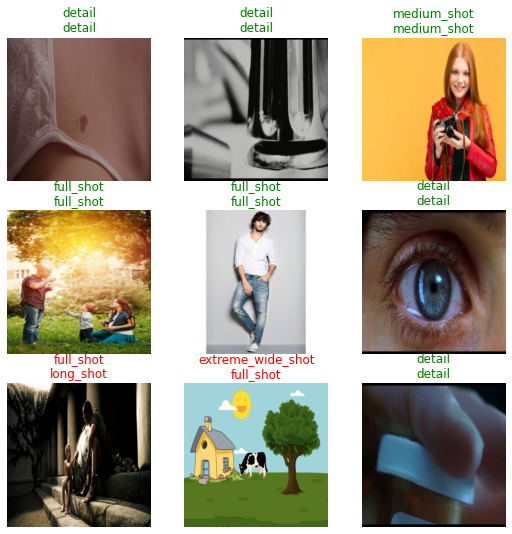

In [15]:
learn.show_results()

In [26]:
# interp.plot_top_losses(9, figsize=(12,6))

Predicting animated models:

In [1]:
learn.export(os.path.abspath('./model.pkl'))

NameError: name 'learn' is not defined

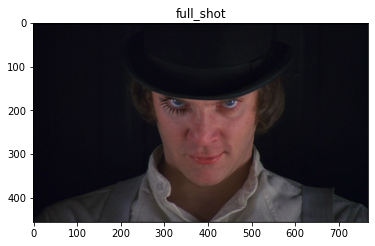

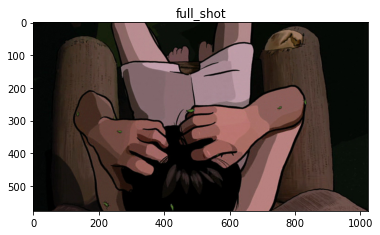

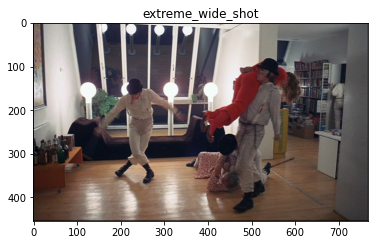

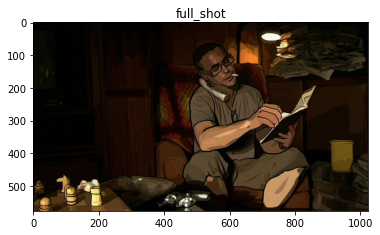

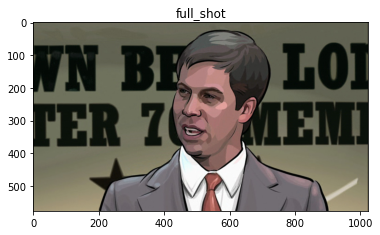

...

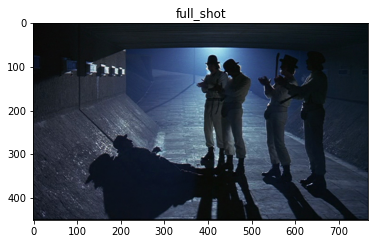

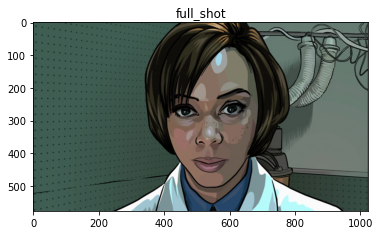

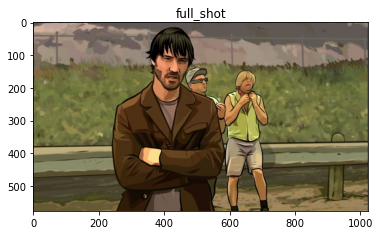

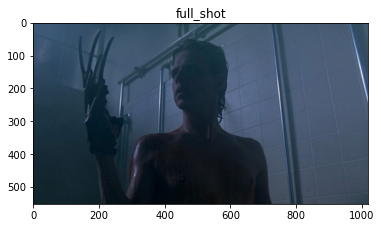

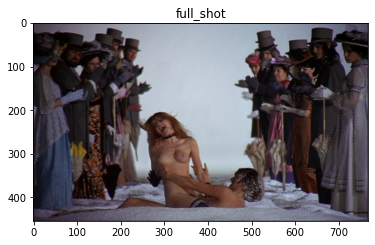

In [8]:
tmp = Path("D:\\Programowanie\\AI\\shot_classifier\\test")
tests = [file for file in tmp.iterdir()]
for file in tests:
    img = Image.open(file)
    plt.figure()
    plt.imshow(img,cmap='magma')
    plt.title(str(learn.predict(file)[0])) 

In [14]:
learn.load('model')

FileNotFoundError: [Errno 2] No such file or directory: 'LearningSet_2\\models\\model.pth'

In [6]:
torch.onnx.export(
    learn,
    torch.randn(1, 3, 640, 360).cuda(),
    "shot_classifier.onnx",
    input_names=["image"],
    output_names=["shot_types"]
)
with open("shot_classifier.txt", "w") as f:
    f.write("\n".join(list(learn.dls.vocab)))

AttributeError: 'Learner' object has no attribute 'train'

In [56]:
import onnxruntime as nxrun
import numpy as np
from skimage.transform import resize
from skimage import io

classes = ['close_up_shot','detail','extreme_wide_shot','full_shot','long_shot','medium_shot']


img = io.imread("./test/12-years-a-slave-7.png")
img = np.rollaxis(img, 2, 0) 
img224 = resize(img / 255, (3, 640, 360), anti_aliasing=True)
ximg = img224[np.newaxis, :, :, :]
ximg = ximg.astype(np.float32)

sess = nxrun.InferenceSession("./shot_classifier.onnx")
print("The model expects input shape: ", sess.get_inputs()[0].shape)
print("The shape of the Image is: ", ximg.shape)
input_name = sess.get_inputs()[0].name
label_name = sess.get_outputs()[0].name
result = sess.run(None, {input_name: ximg})
prob = result[0]
final = prob.ravel()[:10]
print(classes[np.argmax(final)])


The model expects input shape:  [1, 3, 640, 360]
The shape of the Image is:  (1, 3, 640, 360)
full_shot
